# Attribution
This notebook is adapted from the ROICaT project by Rich Hakim (GitHub: RichieHakim/ROICaT).
Original source: https://github.com/RichieHakim/ROICaT

License: GNU General Public License v3.0 (GPL-3.0). This notebook includes content adapted from ROICaT, which is licensed under GPL-3.0. You must preserve copyright and license notices and distribute derivative works under the same license. See https://www.gnu.org/licenses/gpl-3.0.en.html

If you redistribute or publish this notebook (or a larger work that includes it), ensure you comply with GPL-3.0 requirements (provide source code, preserve notices, and apply the same license to derivative works).

# Intro

Welcome to the interactive tracking notebook!\
This notebook goes through each step and allows you to tune parameters and view how it changes the results.

The notebook proceeds as follows:
1. **Import** libraries
2. Define **paths** to data
3. Run data through the **pipeline**. Each step of the pipeline is run by a single unique python class.
4. **Visualize** results
5. **Save** results

As you go through the notebook, take note of the small number of parameters that are mentioned as **'important parameters'** (consider searching for these in the notebook). We consider these to be the only parameters that can have a large effect on the run output. Other parameters matter and should be considered as well, but are less critical.

# Import libraries

Widen the notebook

In [1]:
# widen jupyter notebook window
from IPython.display import display, HTML
display(HTML("<style>.container {width:95% !important; }</style>"))
display(HTML("<style>:root { --jp-notebook-max-width: 100% !important; }</style>"))

Set before importing roicat/numba/numpy to prevent Intel OpenMP crash on macOS 26 beta

In [2]:
import os

os.environ['NUMBA_THREADING_LAYER'] = 'workqueue'
os.environ['NUMBA_NUM_THREADS'] = '1'
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'

Import basic libraries

In [3]:
from pathlib import Path
import multiprocessing as mp
import tempfile

import numpy as np

Import `roicat`

In [4]:
import roicat

### Device and seed

Set these once here so they're available to every step below.

In [5]:
DEVICE = roicat.helpers.set_device(use_GPU=False)
SEED   = roicat.util.set_random_seed(seed=None, deterministic=False)

Using device: cpu


# Find paths to data

In this example we are using suite2p output files, but other data types can be used (CaImAn, etc.) \
See the notebook on ingesting diverse data: https://github.com/RichieHakim/ROICaT/blob/main/notebooks/jupyter/other/demo_data_importing.ipynb

Make a list containing the paths to all the input files. 

**Change `dir_allOuterFolders` to the directory where the suite2p session folders are.**

In this example we are using suite2p, so the following are defined:
1. `paths_allStat`: a list to all the stat.npy files
2. `paths_allOps`: a list with ops.npy files that correspond 1-to-1 with the stat.npy files

In [6]:
dir_allOuterFolders = r'/Volumes/Elements/Najafi/2P_Imaging/YH03VT'

pathSuffixToStat = 'stat.npy'
pathSuffixToOps = 'ops.npy'

# Sessions can carry several stat.npy copies (suite2p/plane0, qc_results,
# manual_qc_results). Pick exactly one source per session so a session is never
# handed to ROICaT twice. 'suite2p/plane0' is the only source present in every
# session on the drive; switch to 'manual_qc_results' to track the curated ROIs
# instead (only some sessions have it -- the rest get skipped, and reported).
STAT_SOURCE = 'suite2p/plane0'

# Folders that are not sessions.
EXCLUDE_DIRS = {'batches', 'results', 'memmap'}


def session_dir(stat_path):
    """Session folder for a stat.npy path.

    Handles both layouts on the drive: <session>/qc_results/stat.npy and
    <session>/suite2p/plane0/stat.npy.
    """
    for d in Path(stat_path).parents:
        if (d / 'bpod_session_data.mat').exists():
            return d
    return Path(stat_path).parents[1]


def find_ops(stat_path):
    """ops.npy for a stat.npy. The QC folders hold stat but not ops, so fall
    back to the session's suite2p output and then to the session root."""
    sess = session_dir(stat_path)
    for cand in [Path(stat_path).parent / 'ops.npy',
                 sess / 'suite2p' / 'plane0' / 'ops.npy',
                 sess / 'ops.npy']:
        if cand.exists():
            return str(cand)
    return None


paths_allStat_raw = roicat.helpers.find_paths(
    dir_outer=dir_allOuterFolders,
    reMatch=pathSuffixToStat,
    depth=10,
)
paths_allStat_raw = [
    p for p in paths_allStat_raw
    if not any(part in EXCLUDE_DIRS for part in Path(p).parts)
]

# Group every discovered stat.npy by session, then keep one per session.
by_session = {}
for p in paths_allStat_raw:
    by_session.setdefault(session_dir(p), []).append(Path(p))

paths_allStat, paths_allOps, skipped = [], [], []
for sess in sorted(by_session):
    pick = [p for p in by_session[sess] if p.parent == sess / STAT_SOURCE]
    if not pick:
        available = sorted({str(p.parent.relative_to(sess)) for p in by_session[sess]})
        skipped.append((sess.name, f'no {STAT_SOURCE} (has: {", ".join(available)})'))
        continue
    ops = find_ops(pick[0])
    if ops is None:
        skipped.append((sess.name, 'no ops.npy anywhere in session'))
        continue
    paths_allStat.append(str(pick[0]))
    paths_allOps.append(ops)

assert paths_allStat, f'No sessions with {STAT_SOURCE}/stat.npy under {dir_allOuterFolders}'
assert len(paths_allStat) == len(paths_allOps)
assert len(set(paths_allStat)) == len(paths_allStat), 'duplicate sessions'

print(f'{len(paths_allStat)} sessions found '
      f'(from {len(paths_allStat_raw)} stat files, source: {STAT_SOURCE})\n')
for s, o in zip(paths_allStat, paths_allOps):
    sess = session_dir(s)
    ops_note = '' if Path(o).parent == Path(s).parent else f'   [ops <- {Path(o).parent.relative_to(sess)}]'
    print(f'  {sess.name}{ops_note}')

if skipped:
    print(f'\n{len(skipped)} session(s) skipped:')
    for name, why in skipped:
        print(f'  {name}: {why}')


7 sessions found (from 7 stat files, source: suite2p/plane0)

  VTYH03_PPC_20250106_3331Random
  VTYH03_PPC_20250107_3331Random
  VTYH03_PPC_20250111_3331Random
  VTYH03_PPC_20250118_4131FixJitterOdd
  VTYH03_PPC_20250120_4131FixJitterOdd
  VTYH03_PPC_20250129_4131FixJitterOdd
  VTYH03_PPC_20250130_4131FixJitterOdd


In [7]:
import scipy.io as sio


def get_stim_type(stat_path):
    """Return the session's stimulus type, read from bpod_session_data.mat.

    Joystick sessions -> 'VG' / 'ST'                (SelfTimedMode in TrialSettings.GUI)
    Passive sessions  -> 'random' / 'fix_jitter_odd' (RandomTypes / OddballTypes)
    Anything else     -> 'unknown'
    """
    bpod_path = session_dir(stat_path) / 'bpod_session_data.mat'
    if not bpod_path.exists():
        return 'unknown'
    try:
        sd = sio.loadmat(str(bpod_path), simplify_cells=True)['SessionData']

        # Joystick: SelfTimedMode lives in the per-trial GUI settings.
        ts = sd.get('TrialSettings')
        if ts is not None and len(ts) > 0:
            stm = ts[0]['GUI'].get('SelfTimedMode', None)
            if stm is not None:
                return 'ST' if stm else 'VG'

        # Passive: 3331Random flags every trial random with no oddballs;
        # 4131FixJitterOdd interleaves oddballs over a fix/jitter split.
        if 'RandomTypes' in sd:
            random_types = np.atleast_1d(np.asarray(sd['RandomTypes']))
            oddball_types = np.atleast_1d(np.asarray(sd.get('OddballTypes', 0)))
            if np.all(random_types == 1) and not np.any(oddball_types):
                return 'random'
            return 'fix_jitter_odd'
    except Exception:
        return 'unknown'
    return 'unknown'


stim_types_all = [get_stim_type(p) for p in paths_allStat]
print('Stim types:')
for p, s in zip(paths_allStat, stim_types_all):
    print(f'  {session_dir(p).name}  →  {s}')


Stim types:
  VTYH03_PPC_20250106_3331Random  →  random
  VTYH03_PPC_20250107_3331Random  →  random
  VTYH03_PPC_20250111_3331Random  →  random
  VTYH03_PPC_20250118_4131FixJitterOdd  →  fix_jitter_odd
  VTYH03_PPC_20250120_4131FixJitterOdd  →  fix_jitter_odd
  VTYH03_PPC_20250129_4131FixJitterOdd  →  fix_jitter_odd
  VTYH03_PPC_20250130_4131FixJitterOdd  →  fix_jitter_odd


# Import data

**Important parameters**:
- `um_per_pixel` (float):
    - Resolution. 'micrometers per pixel' of the imaging field of view.

In [11]:
import pipeline as pipe

## IMPORTANT PARAMETER: micrometers per pixel for your imaging setup.
## Use a list of floats if values differ across sessions.
um_per_pixel = 1.0

data, keep = pipe.filter_sessions_by_overlap(
    paths_stat=paths_allStat,
    paths_ops=paths_allOps,
    um_per_pixel=um_per_pixel,
    device=DEVICE,
)
print(f'\n{data.n_sessions} sessions ready.')

  0%|          | 0/7 [00:00<?, ?it/s]

Loaded LightGlue model
Converting float fractional index to integer index: 0.5 -> 3
Session filter: 7/7 sessions kept
  keep  [0]  suite2p
  keep  [1]  suite2p
  keep  [2]  suite2p
  keep  [3]  suite2p
  keep  [4]  suite2p
  keep  [5]  suite2p
  keep  [6]  suite2p

7 sessions ready.


**Note on subselecting ROIs**:

Generally, I recommend the following:
- Do not subselecting ROIs prior to tracking. Use all available ROIs for the entire tracking process.
- Then, after tracking, subsequently apply classification and inclusion criteria to remove bad ROIs. See the 'tracking_handling_outputs.ipynb' notebook for details.

However, if you want to subselect ROIs before tracking you can call `data.remove_ROIs_by_classLabel()`. Prior to doing this, you will first need to set the class labels in the `data` object by either calling `data.set_class_labels()` or providing the `paths_iscell` input argument (if using the `Data_suite2p` class). Code below:

```python
data.remove_rois_by_classLabel(classLabel_to_keep=1, verbose=True)
```


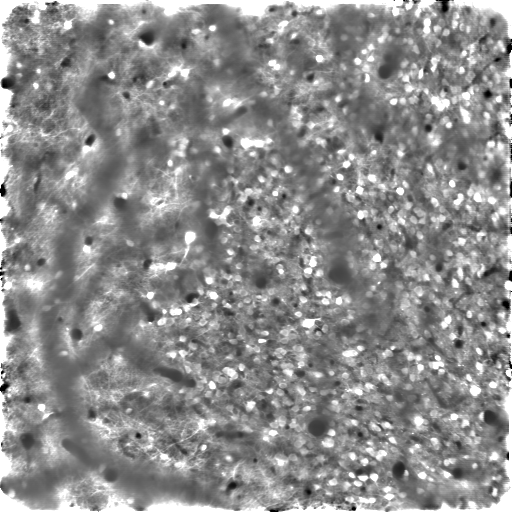


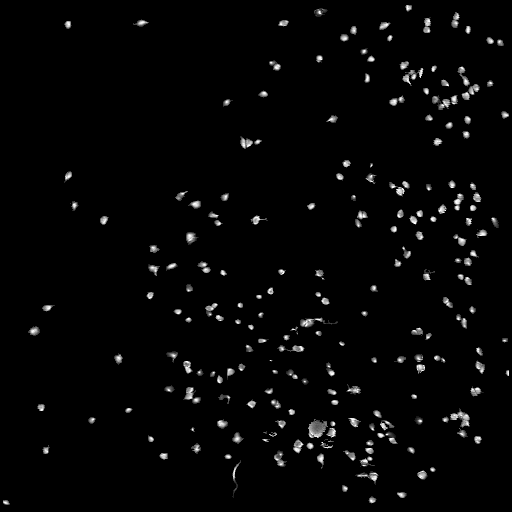


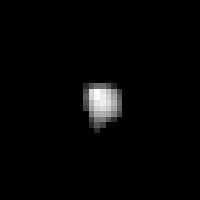

In [12]:
roicat.visualization.display_toggle_image_stack(data.FOV_images)
roicat.visualization.display_toggle_image_stack(data.get_maxIntensityProjection_spatialFootprints(), clim=[0,1])
roicat.visualization.display_toggle_image_stack(np.concatenate(data.ROI_images, axis=0)[:5000], image_size=(200,200))

# Alignment

This is the most important step in the pipeline to stop and check that everything looks okay and tune parameters if necessary.

Alignment is 4 steps:

1. FOV_image augmentation
2. Fit geometric transformation
3. Fit non-rigid transformation (on top of the geometric)
4. Apply transformation to ROIs

##### 1. FOV_image augmentation
Do what is necessary to make the augmented FOV_images look good. Use the visualization tool below to help. This can include playing with the mixing factor, normalization, and playing with the CLAHE parameters.

In [13]:
aligner = roicat.tracking.alignment.Aligner(
    use_match_search=True,  ## Use our algorithm for doing all-pairs matching if template matching fails.
    all_to_all=False,  ## Force the use of our algorithm for all-pairs matching. Much slower (False: O(N) vs. True: O(N^2)), but more accurate.
    radius_in=4,  ## IMPORTANT PARAMETER: Value in micrometers used to define the maximum shift/offset between two images that are considered to be aligned. Larger means more lenient alignment.
    radius_out=20,  ## Value in micrometers used to define the minimum shift/offset between two images that are considered to be misaligned.
    z_threshold=4.0,  ## IMPORTANT PARAMETER: Z-score required to define two images as aligned. Larger values results in more stringent alignment requirements.
    um_per_pixel=data.um_per_pixel[0],  ## Single value for um_per_pixel. data.um_per_pixel is typically a list of floats, so index out just one value.
    device=DEVICE,
    verbose=True,
)

In [14]:
FOV_images = aligner.augment_FOV_images(
    FOV_images=data.FOV_images,
    spatialFootprints=data.spatialFootprints,
    normalize_FOV_intensities=True,
    roi_FOV_mixing_factor=0.5,
    use_CLAHE=True,  ## IMPORTANT PARAMETER. Use Set to False if data is poor quality or poorly aligned.
    CLAHE_grid_block_size=10,  ## IMPORTANT PARAMETER. Use smaller values for higher precision but higher chance of failure.
    CLAHE_clipLimit=1.0,
    CLAHE_normalize=True,
)

View the augmented FOV images


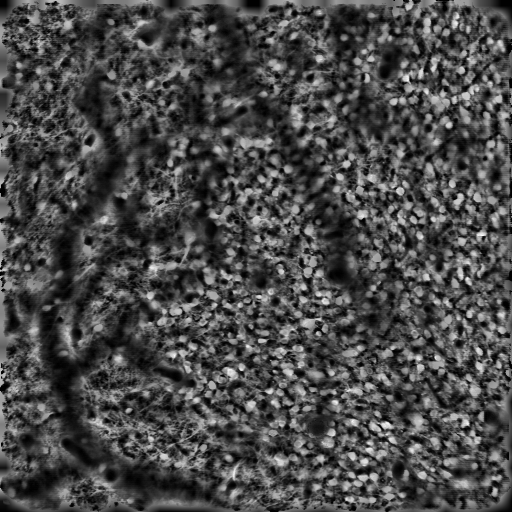

In [15]:
roicat.visualization.display_toggle_image_stack(FOV_images)

##### 2. Fit geometric transformation
This is an important step. Consider reading the comments and arguments closely.

Play with parameters until the aligned FOV_images look good. The visualization tool below can help.

This step creates the attribute: `aligner.ims_registered_geo`, which are the registered images after the geometric transformation.

We like the following **important parameters**:
- `template=0.5`
- `method='RoMa'` if you have a GPU, otherwise use one of the other methods
- `template_method='sequential'` best if there are large changes that occurrs slowly over sessions

In [16]:
aligner.fit_geometric(
    template=0.5,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    ims_moving=FOV_images,  ## input images
    template_method='sequential',  ## 'sequential': align images to neighboring images (good for drifting data). 'image': align to a single image
    mask_borders=(0, 0, 0, 0),  ## number of pixels to mask off the edges (top, bottom, left, right)
    method='DISK_LightGlue',  ## See below for options.
    kwargs_method = {
        'RoMa': {  ## Accuracy: Best, Speed: Very slow (can be fast with a GPU).
            'model_type': 'outdoor',
            'n_points': 10000,  ## Higher values mean more points are used for the registration. Useful for larger FOV_images. Larger means slower.
            'batch_size': 1000,
        },
        'DISK_LightGlue': {  ## Accuracy: Good, Speed: Fast.
            'num_features': 3000,  ## Number of features to extract and match. I've seen best results around 2048 despite higher values typically being better.
            'threshold_confidence': 0.0,  ## Higher values means fewer but better matches.
            'window_nms': 7,  ## Non-maximum suppression window size. Larger values mean fewer non-suppressed points.
        },
        'LoFTR': {  ## Accuracy: Okay. Speed: Medium.
            'model_type': 'indoor_new',
            'threshold_confidence': 0.2,  ## Higher values means fewer but better matches.
        },
        'ECC_cv2': {  ## Accuracy: Okay. Speed: Medium.
            'mode_transform': 'euclidean',  ## Must be one of {'translation', 'affine', 'euclidean', 'homography'}. See cv2 documentation on findTransformECC for more details.
            'n_iter': 200,
            'termination_eps': 1e-09,  ## Termination criteria for the registration algorithm. See documentation for more details.
            'gaussFiltSize': 1,  ## Size of the gaussian filter used to smooth the FOV_image before registration. Larger values mean more smoothing.
            'auto_fix_gaussFilt_step': 10,  ## If the registration fails, then the gaussian filter size is reduced by this amount and the registration is tried again.
        },
        'PhaseCorrelation': {  ## Accuracy: Poor. Speed: Very fast. Notes: Only applicable for translations, not rotations or scaling.
            'bandpass_freqs': [1, 30],
            'order': 5,
        },
        'NullRegistration': {},  ## No registration, no warping.
    },
    constraint='affine',  ## Must be one of {'rigid', 'euclidean', 'similarity', 'affine', 'homography'}. Choose constraint based on expected changes in images; use the simplest constraint that is applicable.
    kwargs_RANSAC = {
        'inl_thresh': 3.0,  ## cv2.findHomography RANSAC inlier threshold. Larger values mean more lenient matching.
        'max_iter': 100,
        'confidence': 0.99,
    },
    verbose=True,  ## Set to 3 to view plots of the alignment process if available for the method.
);

Loaded LightGlue model
Converting float fractional index to integer index: 0.5 -> 3


Finding geometric registration warps:   0%|          | 0/7 [00:00<?, ?it/s]

Alignment z_in scores: [53.7, 21.8, 40.1, 3303480832.0, 84.0, 12.5, 14.1]. z_threshold: 4.0.
All images aligned successfully!


Plot the alignment scores. The '(final)' score is the alignment score between a pair of images given the final compsed geometric transformation between them. The '(direct)' score (only shown if the match search algorithm was used) is the alignment score between a pair of images given the single direct geometric transformation between them.

In [17]:
aligner.plot_alignment_results_geometric();

##### 3. Fit non-rigid transformation
Play with parameters until the aligned FOV_images look good. The visualization tool below can help.

We like the following **important parameters**:
- `template`=0.5
- `template_method`='image'


In [18]:
aligner.fit_nonrigid(
    template=0.5,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    ims_moving=aligner.ims_registered_geo,  ## Input images. Typically the geometrically registered images
    remappingIdx_init=aligner.remappingIdx_geo,  ## The remappingIdx between the original images (and ROIs) and ims_moving
    template_method='image',  ## 'sequential': align images to neighboring images. 'image': align to a single image, good if using geometric registration first
    method='DeepFlow',
    kwargs_method = {
        'DeepFlow': {},  ## Accuracy: Good (good in middle, poor on edges), Speed: Fast (CPU only)
        'RoMa': {  ## Accuracy: Okay (decent in middle, poor on edges), Speed: Slow (can be fast with a GPU), Notes: This method can work on the raw images without pre-registering using geometric methods.
            'model_type': 'outdoor',
        },
        'OpticalFlowFarneback': {  ## Accuracy: Varies (can sometimes be tuned to be the best as there are no edge artifacts), Speed: Medium (CPU only)
            'pyr_scale': 0.7,
            'levels': 5,
            'winsize': 256,
            'iterations': 15,
            'poly_n': 5,
            'poly_sigma': 1.5,            
        },
        'NullRegistration': {},
    },    
)

aligner.transform_images_nonrigid(FOV_images);

Converting float fractional index to integer index: 0.5 -> 3
Finding nonrigid registration warps with mode: DeepFlow, template_method: image


Finding nonrigid registration warps:   0%|          | 0/7 [00:00<?, ?image/s]

Composing nonrigid warp matrices...
Applying nonrigid registration warps to images...


In [19]:
aligner.plot_alignment_results_nonrigid();

##### 4. Transform ROIs

In [20]:
aligner.transform_ROIs(
    ROIs=data.spatialFootprints, 
    remappingIdx=aligner.remappingIdx_nonrigid,
    # remappingIdx=aligner.remappingIdx_geo,
    normalize=True,
);

Registering ROIs...


Registering ROIs:   0%|          | 0/7 [00:00<?, ?it/s]

Ensure that the aligned FOVs look aligned

Pre-alignment below



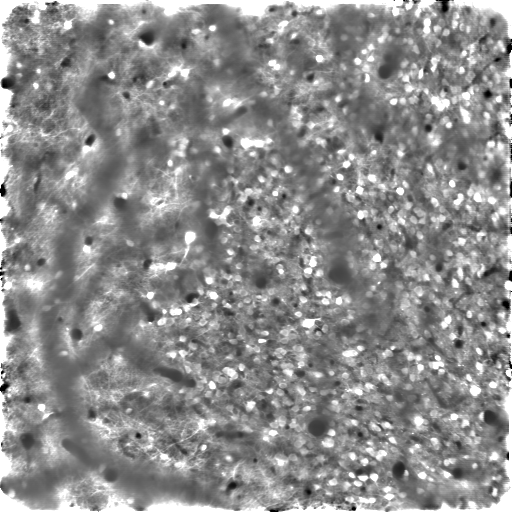

Geometric alignment below



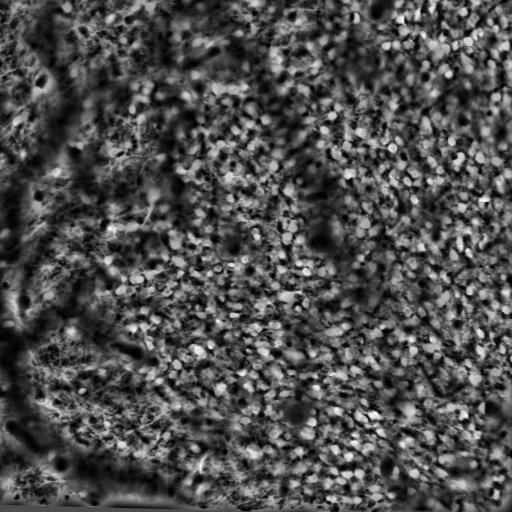

Non-rigid alignment below



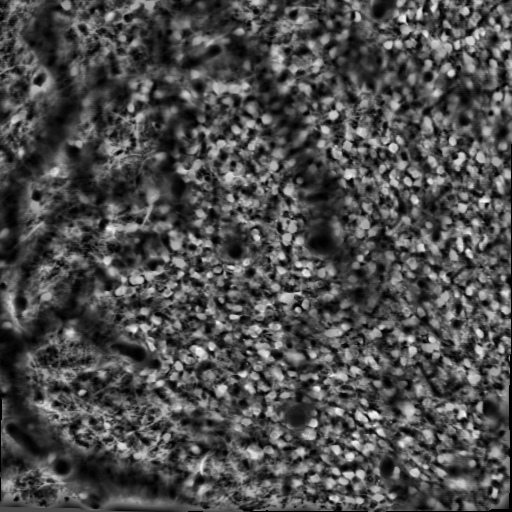

Transformed ROIs below



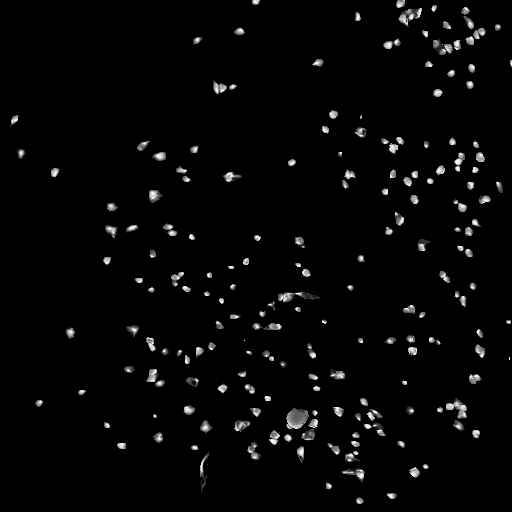

In [21]:
print(f'Pre-alignment below')
roicat.visualization.display_toggle_image_stack(data.FOV_images)
print(f'Geometric alignment below')
roicat.visualization.display_toggle_image_stack(aligner.ims_registered_geo)
print(f'Non-rigid alignment below')
roicat.visualization.display_toggle_image_stack(aligner.ims_registered_nonrigid)
print(f'Transformed ROIs below')
roicat.visualization.display_toggle_image_stack(aligner.get_ROIsAligned_maxIntensityProjection(normalize=True), clim=None)

# Blur ROIs

ROIs from different sessions with zero spatial overlap have very low probability of being considered the same ROI during the clustering step. Blurring the spatial footprint masks can increase the overlap between ROIs that drift apart from each other. It's a good idea to increase the `kernel_halfWidth` if you are working with sparsely labeled ROIs or ROIs that change/move from session to session.

In [22]:
blurrer = roicat.tracking.blurring.ROI_Blurrer(
    frame_shape=(data.FOV_height, data.FOV_width),  ## FOV height and width
    kernel_halfWidth=4,  ## The half width of the 2D gaussian used to blur the ROI masks
    plot_kernel=False,  ## Whether to visualize the 2D gaussian
)

blurrer.blur_ROIs(
    spatialFootprints=aligner.ROIs_aligned[:],
);

Preparing sparse convolution
Performing convolution for blurring


See that the blurred ROIs are overlapping each other


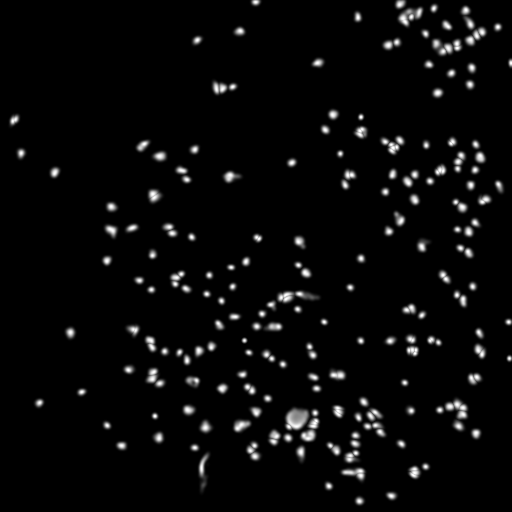

In [23]:
roicat.visualization.display_toggle_image_stack(blurrer.get_ROIsBlurred_maxIntensityProjection())

# ROInet embedding

This step passes the images of each ROI through the ROInet neural network. The inputs are the images, the output is an array describing the visual properties of each ROI.

Initialize the ROInet object. The `ROInet_embedder` class will automatically download and load a pretrained ROInet model. If you have a GPU, this step will be much faster.

In [24]:
dir_temp = tempfile.gettempdir()

roinet = roicat.ROInet.ROInet_embedder(
    device=DEVICE,  ## Which torch device to use ('cpu', 'cuda', etc.)
    dir_networkFiles=dir_temp,  ## Directory to download the pretrained network to
    download_method='check_local_first',  ## Check to see if a model has already been downloaded to the location (will skip if hash matches)
    download_url='https://osf.io/x3fd2/download',  ## URL of the model
    download_hash='7a5fb8ad94b110037785a46b9463ea94',  ## Hash of the model file
    forward_pass_version='latent',  ## How the data is passed through the network
    verbose=True,  ## Whether to print updates
)

File already exists locally: /private/var/folders/rq/btw0lv257pnfvzzx6y9gdtph0000gn/T/ROInet.zip
Hash of local file matches provided hash_hex.
Extracting /private/var/folders/rq/btw0lv257pnfvzzx6y9gdtph0000gn/T/ROInet.zip to /private/var/folders/rq/btw0lv257pnfvzzx6y9gdtph0000gn/T.
Completed zip extraction.
Imported model from /private/var/folders/rq/btw0lv257pnfvzzx6y9gdtph0000gn/T/ROInet_tracking_20220527/model.py
Loaded params_model from /private/var/folders/rq/btw0lv257pnfvzzx6y9gdtph0000gn/T/ROInet_tracking_20220527/params.json


/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Generated network using params_model
Loaded state_dict into network from /private/var/folders/rq/btw0lv257pnfvzzx6y9gdtph0000gn/T/ROInet_tracking_20220527/ConvNext_tiny__1_0_best__simCLR.pth
Loaded network onto device cpu


Resize ROIs and prepare a dataloader.

**Important parameters**:
- `um_per_pixel`: (same as specified in `data` object). Resolution of FOV. This is used to resize the ROIs to be relatively consistent across resolutions.

In [25]:
roinet.generate_dataloader(
    ROI_images=data.ROI_images,  ## Input images of ROIs
    um_per_pixel=data.um_per_pixel,  ## Resolution of FOV
    pref_plot=False,  ## Whether or not to plot the ROI sizes
    
    jit_script_transforms=False,  ## (advanced) Whether or not to use torch.jit.script to speed things up
    
    batchSize_dataloader=8,  ## (advanced) PyTorch dataloader batch_size
    pinMemory_dataloader=True,  ## (advanced) PyTorch dataloader pin_memory
    numWorkers_dataloader=0,  ## (advanced) PyTorch dataloader num_workers (0 = main process, avoids broken-pipe on macOS)
    persistentWorkers_dataloader=False,  ## (advanced) PyTorch dataloader persistent_workers (must be False when numWorkers=0)
    prefetchFactor_dataloader=None,  ## (advanced) PyTorch dataloader prefetch_factor (must be None when numWorkers=0)
);

Starting Image Resizer
Creating dataloader
Defined image transformations: Sequential(
  (0): ScaleDynamicRange(scaler_bounds=(0, 1))
  (1): Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
  (2): TileChannels(dim=0)
)
Defined dataset
Defined dataloader


In general, you want to see that a neuron fills roughly 25-50% of the area of the image.


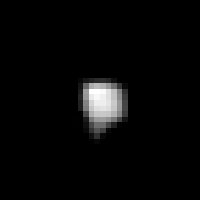

In [26]:
roicat.visualization.display_toggle_image_stack(roinet.ROI_images_rs[:1000], image_size=(200,200))

Pass the data through the network. Expect for large datasets (~40,000 ROIs) that this takes around 15 minutes on CPU or 1 minute on GPU.

In [27]:
roinet.generate_latents();

starting: running data through network


/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, device pinned memory won't be used.
  super().__init__(loader)


  0%|          | 0/343 [00:00<?, ?it/s]

completed: running data through network


# Scattering wavelet embedding

This is similar to the ROInet embedding in purpose.

In [28]:
swt = roicat.tracking.scatteringWaveletTransformer.SWT(
    kwargs_Scattering2D={'J': 2, 'L': 12},  ## 'J' is the number of convolutional layers. 'L' is the number of wavelet angles.
    image_shape=data.ROI_images[0].shape[1:3],  ## size of a cropped ROI image
    device=DEVICE,  ## PyTorch device
)

swt.transform(
    ROI_images=roinet.ROI_images_rs,  ## All the cropped and resized ROI images
    batch_size=100,  ## Batch size for each iteration (smaller is less memory but slower)
);

SWT initialized
Starting: SWT transform on ROIs


  0%|          | 0/27.43 [00:00<?, ?it/s]

Completed: SWT transform on ROIs


# Compute similarities

Now we can compare the similarities of the ROIs. This includes calculating several kinds of similarities:
1. `similarities['sf']`: 'similarity spatial footprint'. The physical overlap between ROIs.
2. `similarities['nn']`: 'similarity neural network'. The similarities of the embeddings out of ROInet.
3. `similarities['swt']`: 'similarity scaterring wavelet transform'. The similarities of the embeddings out of the scattering wavelet transformer.
4. `s_sesh`: 'similarity sessions'. 0 if from the same session, 1 if from different sessions. ROIs from the same session have 0 probability of being the same.

The result of this step will be a set of pairwise similarity matrices.

Initialize the `ROI_graph` class and compute similarities.
To make computation more efficient, only ROIs within the same 'block' are compared against each other.

In [29]:
sim = roicat.tracking.similarity_graph.ROI_graph(
    n_workers=-1,  ## Number of CPU cores to use. -1 for all.
    frame_height=data.FOV_height,
    frame_width=data.FOV_width,
    block_height=128,  ## size of a block
    block_width=128,  ## size of a block
    algorithm_nearestNeigbors_spatialFootprints='brute',  ## algorithm used to find the pairwise similarity for s_sf. ('brute' is slow but exact. See docs for others.)
    verbose=True,  ## Whether to print outputs
)

sim.visualize_blocks()

similarities = sim.compute_similarity_blockwise(
    spatialFootprints=blurrer.ROIs_blurred,  ## Mask spatial footprints
    features={'nn': roinet.latents, 'swt': swt.latents},  ## Feature latents dict
    ROI_session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
    spatialFootprint_maskPower=1.0,  ##  An exponent to raise the spatial footprints to to care more or less about bright pixels
);

Computing pairwise similarity between ROIs...


  0%|          | 0/16 [00:00<?, ?it/s]

Joining blocks into full similarity matrices...
Joining sf...
Joining nn...
Joining swt...
Joining s_sesh...


It is useful to normalize the similarity matrices using the local ROIs.

In [30]:
sim.make_normalized_similarities(
    centers_of_mass=data.centroids,  ## ROI centroid positions
    features={'nn': roinet.latents, 'swt': swt.latents},  ## Feature latents dict
    k_max=data.n_sessions*100,  ## Maximum number of nearest neighbors to consider for the normalizing distribution
    k_min=data.n_sessions*10,  ## Minimum number of nearest neighbors to consider for the normalizing distribution
    algo_NN='kd_tree',  ## Nearest neighbors algorithm to use
    device=DEVICE,
)

Finding k-range of center of mass distance neighbors for each ROI...
Normalizing nn similarity scores...


  0%|          | 0/2743 [00:00<?, ?it/s]

Normalizing swt similarity scores...


  0%|          | 0/2743 [00:00<?, ?it/s]

# Clustering

This step does the following:
1. Mix the similarity matrices into a single distance matrix
2. Prune the distance matrix to remove low probability connections
3. Perform clustering
4. Compute quality metrics

#### 1. Mix the similarity matrices into a single distance matrix

This step can be done either automatically, using the `clusterer.find_optimal_parameters_for_pruning` method, or manually by specifying the `mixing_params` dictionary. If you have a smaller total number of ROIs (<100 ROIs per session and/or <8 sessions), then it may be a good idea to manually play with the parameters in the next cell instead of using the automatic method.

<br></br>

##### Option A: Automatic Method (Recommended)
This method uses a two-stage approach:
1. **Naive Bayes calibration**: For each similarity feature (SF, NN, SWT), estimates the probability that a pair of ROIs is the same neuron given their similarity. The resulting calibration curves are used to analytically estimate optimal sigmoid parameters (mu, b) via Fisher's linear discriminant.
2. **Differential evolution (DE)**: With sigmoid parameters frozen from stage 1, optimizes the remaining 3 mixing parameters (`power_nn`, `power_swt`, `p_norm`) by minimizing the histogram overlap between the "same" and "different" pair distributions. When the dataset is large enough, a subsample of pairs is used and redrawn each generation for robustness.

The output is the optimal `mixing_params` dictionary.

<br></br>

##### Option B: Manual Method
You can also simply specify the `mixing_params` dictionary manually. This is useful if you have a good idea of what the optimal parameters are or if the automatic method is not working well. Uncomment the code block below to overwrite the `kwargs_mcdm_tmp` variable.

<br></br>

#### TROUBLESHOOTING FOR THIS STEP
- If you have any issues, just email Rich Hakim or open an issue on the github issues page.
- If you see: `'No crossover found, not plotting'`: Your data may not be easily separable. For some people, this is because the number of matching ROIs is very low compared to the number of non-matching ROIs. I recommend trying out the manual method.

In [31]:
from roicat.tracking.similarity_graph import DEFAULT_METRICS

## Initialize the clusterer object by passing the similarity matrices in
clusterer = roicat.tracking.clustering.Clusterer(
    similarities=sim.similarities_final,
    metric_configs=DEFAULT_METRICS,
    s_sesh=sim.s_sesh,
    session_bool=data.session_bool,
    verbose=1,
)

#### Automatic method

In [32]:
## Automatic method: NB calibration + freeze-sigmoid DE
kwargs_makeConjunctiveDistanceMatrix_best = clusterer.find_optimal_parameters_for_pruning(
    n_bins=None,  ## Number of bins for the pairwise distance histograms. None = heuristic.
    smoothing_window_bins=None,  ## Smoothing window for the histograms. None = heuristic.
    subsample_pairs=None,  ## Number of pairs to subsample for DE. None = auto (min 100k intra + 1M inter, otherwise full).
    bounds_findParameters={
        'power_nn': [0.0, 2.],  ## Bounds for the exponent applied to s_NN
        'power_swt': [0.0, 2.],  ## Bounds for the exponent applied to s_SWT
        'p_norm': [-5, -0.1],  ## Bounds for the p-norm p value (Minkowski) applied to mix the matrices
    },
    de_kwargs={
        'maxiter': 100,  ## Maximum number of DE generations
        'tol': 1e-6,  ## Convergence tolerance
        'popsize': 15,  ## Population size multiplier (actual pop = popsize * n_params)
        'mutation': (0.5, 1.5),  ## Differential weight range for dithering
        'recombination': 0.7,  ## Crossover probability
        'polish': True,  ## Run L-BFGS-B from best DE solution (often has no effect)
    },
    seed=SEED,
)

Computing naive Bayes distance matrix...
  sf: P(same) range [0.0001, 0.9999], mean=0.1459
  nn: P(same) range [0.0018, 0.9999], mean=0.0376
  swt: P(same) range [0.0019, 0.9999], mean=0.0572
  Combined P(same): mean=0.1046, prior=0.0746, P(same)>0.5: 3240/32410 (10.0%)
  Sigmoid estimate for nn: mu=1.8595, b=9.02 (Fisher=6.0530)
  Sigmoid estimate for swt: mu=0.1240, b=10.00 (Fisher=1.0150)
  Freezing sigmoid: nn(mu=1.860, b=9.0), swt(mu=0.124, b=10.0)
Finding mixing parameters using differential evolution...
Completed DE parameter search. Best value: 30551.60, evaluations: 3379, params: {'power_sf': None, 'power_nn': 1.8374857245439984, 'power_swt': 0.6774497630074356, 'p_norm': -4.998099733540488, 'sig_sf_kwargs': None, 'sig_nn_kwargs': {'mu': 1.859511346233134, 'b': 9.017241379310345}, 'sig_swt_kwargs': {'mu': 0.12402028453593061, 'b': 10.0}}


#### Manual method

In [ ]:
# # Uncomment below to manually specify mixing parameters
# kwargs_makeConjunctiveDistanceMatrix_best = {
#     'power_sf': 1.0,   ## s_sf**power_sf   (Higher values means clustering is more sensitive to spatial overlap of ROIs)
#     'power_nn': 4.988104678381475,   ## s_NN**power_nn   (Higher values means clustering is more sensitive to visual similarity of ROIs)
#     'power_swt': 3.2306101591115177,  ## s_SWT**power_swt (Higher values means clustering is more sensitive to visual similarity of ROIs)
#     'p_norm': -3.7239759637888254,    ## norm([s_sf, s_NN, s_SWT], p=p_norm) (Higher values means clustering requires all similarity metrics to be high)
# #     'sig_sf_kwargs': {'mu':0.5, 'b':1.0},  ## Sigmoid parameters for s_sf (mu is the center, b is the slope)
#     'sig_sf_kwargs': None,
#     'sig_nn_kwargs': {'mu':0.022482651499435957, 'b':0.02659655318391102},    ## Sigmoid parameters for s_NN (mu is the center, b is the slope)
# #     'sig_nn_kwargs': None,
#     'sig_swt_kwargs': {'mu':0.10929602726304388, 'b':0.25801625013167434}, ## Sigmoid parameters for s_SWT (mu is the center, b is the slope)
# #     'sig_swt_kwargs': None,
# }

#### View mixing results
The goal is to see a **bimodal curve** in the pairwise similarities and a **clear cross-over point** (specified by the vertical dotted line) between 'same' and 'diff' pairs of ROIs.

In [49]:
clusterer.plot_distSame(mixing_params=kwargs_makeConjunctiveDistanceMatrix_best)

clusterer.plot_similarity_relationships(
    max_samples=100000,  ## Make smaller if it is running too slow
    kwargs_scatter={'s':1, 'alpha':0.2},
    mixing_params=kwargs_makeConjunctiveDistanceMatrix_best
);

##### 2. Prune the distance matrix

We can remove all connections in the distance graph with probabilities of connection of less than 50%. We estimate this cutoff distance as the cross-over point between the 'same' and 'different' distributions.

**Important parameter**\
`stringency`: This value changes the threshold for pruning the distance matrix. A higher value will result in less pruning, and a lower value will result in more pruning. The value will be multiplied by the inferred threshold to get the new one.


In [50]:
clusterer.make_pruned_similarity_graphs(
    d_cutoff=None,  ## Optionally manually specify a distance cutoff
    mixing_params=kwargs_makeConjunctiveDistanceMatrix_best,
    stringency=1.0,  ## Modifies the threshold for pruning the distance matrix. Higher values result in LESS pruning. New d_cutoff = stringency * truncated d_cutoff.
    convert_to_probability=False,    
)

Pruning similarity graphs with d_cutoff = 0.3499999940395355...


/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/scipy/sparse/_index.py:216: SparseEfficiencyWarning: Changing the sparsity structure of a csr_array is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


##### 3. Cluster

There are two methods for clustering: The standard method `.fit` which is based on HDBSCAN, and `.fit_sequentialHungarian` which is an algorithm that is also used by CaImAn based on the Hungarian algorithm. The standard method takes 1-20 minutes and works better when there are many sessions, the Hungarian method takes seconds and works better when there are fewer sessions (<8).

**Important parameters**:
- For standard **`.fit`** method:
1. `min_cluster_size`: If you only want ROIs clusters with at least a certain number of samples, specify here.
2. `n_iter_violationCorrection`: This parameter controls how fast this step takes. Turning it down has mild effects on quality. We use around ***6***.

- For **`.fit_sequentialHungarian`** method:
1. `thresh_cost`: Determines the threshold of how distant two ROIs can be and still be matched. Smaller value is more stringent.


In [35]:
if data.n_sessions >= 6:
    labels = clusterer.fit(
        d_conj=clusterer.dConj_pruned,  ## Input distance matrix
        session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
        min_cluster_size=2,  ## Minimum number of ROIs that can be considered a 'cluster'
        min_samples=None,  ## Number of neighbors for core-point density. None defaults to min_cluster_size. Lower values reduce noise points.
        cluster_selection_method='eom',  ## (advanced) Method of cluster selection for HDBSCAN (see hdbscan documentation)
        cluster_selection_persistence=0.0,  ## (advanced) Minimum stability for a cluster to survive. Higher = fewer, more stable clusters.
        d_clusterMerge=None,  ## Distance below which clusters are merged. None defaults to d_cutoff (pruning threshold).
        rescue_noise=True,  ## Post-HDBSCAN: assign noise ROIs to nearby clusters via Kruskal DSU with cannot-link constraints.
    )

else:
    labels = clusterer.fit_sequentialHungarian(
        d_conj=clusterer.dConj_pruned,  ## Input distance matrix
        session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
        thresh_cost=0.8,  ## Threshold. Higher values result in more permissive clustering. Specifically, the pairwise metric distance between ROIs above which two ROIs cannot be clustered together.
    )

Fitting with fast_hdbscan (group-label cannot-link constraints)
Session violations after fast_hdbscan: 0 clusters, d_clusterMerge=0.35
Noise rescue: 573/2137 noise ROIs rescued, 1564 remain noise


##### 4. Quality metrics

Compute various quality scores for each cluster and each ROI.

In [36]:
## SKIP THIS STEP FOR VERY LARGE DATASETS
quality_metrics = clusterer.compute_quality_metrics();

## Collect results

1. Make different versions of the labels for convenience.
2. Put all the useful results and info into a dictionary to save later. ADJUST THIS ANY WAY YOU WANT.
3. Put all the class objects from the run into a dictionary to save later

In [37]:
labels_squeezed, labels_bySession, labels_bool, labels_bool_bySession, labels_dict = roicat.tracking.clustering.make_label_variants(labels=labels, n_roi_bySession=data.n_roi)

results_clusters = {
    'labels': labels_squeezed,
    'labels_bySession': labels_bySession,
    'labels_dict': labels_dict,
    'quality_metrics': clusterer.quality_metrics if hasattr(clusterer, 'quality_metrics') else None,
}

results_all = {
    "clusters":{
        "labels": roicat.util.JSON_List(labels_squeezed),
        "labels_bySession": roicat.util.JSON_List(labels_bySession),
        "labels_bool": labels_bool,
        "labels_bool_bySession": labels_bool_bySession,
        "labels_dict": roicat.util.JSON_Dict(labels_dict),
        "quality_metrics": roicat.util.JSON_Dict(clusterer.quality_metrics) if hasattr(clusterer, 'quality_metrics') else None,
    },
    "ROIs": {
        "ROIs_aligned": aligner.ROIs_aligned,
        "ROIs_raw": data.spatialFootprints,
        "frame_height": data.FOV_height,
        "frame_width": data.FOV_width,
        "idx_roi_session": np.where(data.session_bool)[1],
        "n_sessions": data.n_sessions,
    },
    "input_data": {
        "paths_stat": data.paths_stat,
        "paths_ops": data.paths_ops,
    },
}

run_data = {
    'data': data.__dict__,
    'aligner': aligner.__dict__,
    'blurrer': blurrer.__dict__,
    'roinet': roinet.__dict__,
    'swt': swt.__dict__,
    'sim': sim.__dict__,
    'clusterer': clusterer.__dict__,
}

params_used = {name: mod['params'] for name, mod in run_data.items()}

# Visualize results

In [38]:
print(f'Number of clusters: {len(np.unique(results_clusters["labels"]))}')
print(f'Number of discarded ROIs: {(np.array(results_clusters["labels"])==-1).sum()}')

Number of clusters: 412
Number of discarded ROIs: 1564


Look at some of the distributions of the quality metrics.
- Silhouette score is a particularly useful one for this type of clustering. Learn more here: https://en.wikipedia.org/wiki/Silhouette_(clustering)
- We also define a handy 'confidence' variable which is a nice heuristic you can use for thresholding for inclusion criteria
- Note that the `sample_silhouette` score is a per-sample (per-ROI) score. So it can actually be used to remove / subselect ROIs from clusters.

A good rule of thumb is to use an inclusion criteria of:
- `sample_silhouette` > 0.1
- `cluster_silhouette` > 0.2

In [39]:
roicat.tracking.clustering.plot_quality_metrics(quality_metrics=quality_metrics, labels=labels_squeezed, n_sessions=data.n_sessions);

Look at a color visualization of the results. ROIs of the same color are considered a part of the same cluster. The colors are assigned randomly.


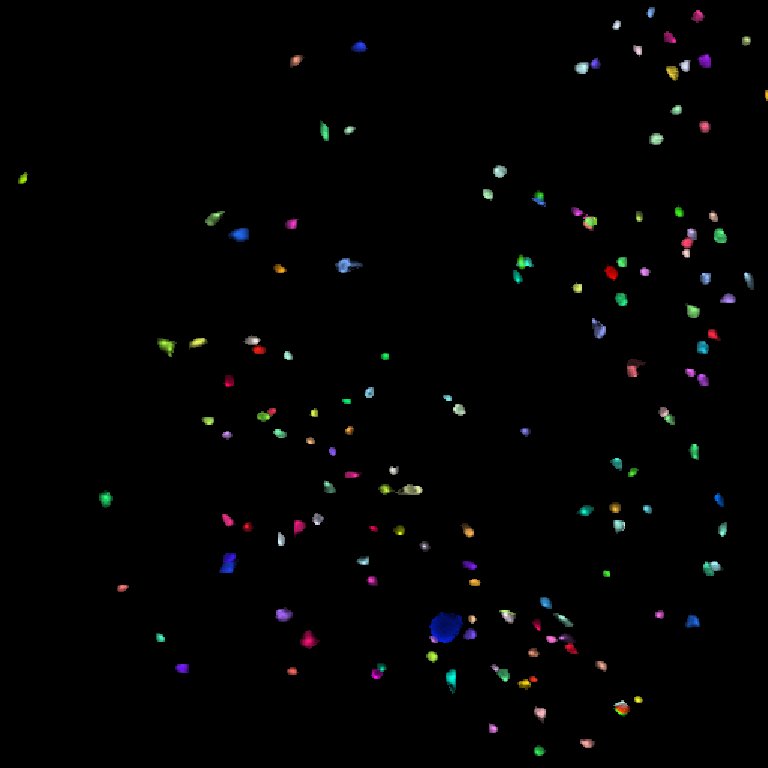

In [40]:
FOV_clusters = roicat.visualization.compute_colored_FOV(
    spatialFootprints=[r.power(1.0) for r in results_all['ROIs']['ROIs_aligned']],  ## Spatial footprint sparse arrays
    FOV_height=results_all['ROIs']['frame_height'],
    FOV_width=results_all['ROIs']['frame_width'],
    labels=results_all["clusters"]["labels_bySession"],  ## cluster labels
#     labels=(np.array(results["clusters"]["labels"])!=-1).astype(np.int64),  ## cluster labels
    # alphas_labels=confidence*1.5,  ## Set brightness of each cluster based on some 1-D array
    # alphas_labels=(np.array(clusterer.quality_metrics['cluster_silhouette']) > -0.2) * (np.array(clusterer.quality_metrics['cluster_intra_means']) > 0.3),
    # alphas_sf=np.array(clusterer.quality_metrics['sample_silhouette']) > 0,  ## Set brightness of each ROI based on some 1-D array
)

roicat.visualization.display_toggle_image_stack(
    FOV_clusters, 
    image_size=1.5,
#     clim=[0,1.0],
)

Visualize the images of ROIs from the same cluster

In [41]:
roicat.visualization.display_cropped_cluster_ims(
    spatialFootprints=results_all['ROIs']['ROIs_aligned'],
    labels=np.array(results_all["clusters"]["labels"]),
    FOV_height=results_all['ROIs']['frame_height'],
    FOV_width=results_all['ROIs']['frame_width'],
    n_labels_to_display=10,    
)

# Save results

In [42]:
## Define the directory to save the results to
dir_save = '/Volumes/Elements/Najafi/2P_Imaging/YH03VT/results'
name_save = 'YH03VT_PPC'

paths_save = {
    'results_clusters': str(Path(dir_save) / f'{name_save}.tracking.results_clusters.json'),
    'params_used':      str(Path(dir_save) / f'{name_save}.tracking.params_used.json'),
    'results_all':      str(Path(dir_save) / f'{name_save}.tracking.results_all.richfile.zip'),
    'run_data':         str(Path(dir_save) / f'{name_save}.tracking.run_data.richfile.zip'),
}

In [43]:
Path(dir_save).mkdir(parents=True, exist_ok=True)

roicat.helpers.json_save(obj=results_clusters, filepath=paths_save['results_clusters'])
roicat.helpers.json_save(obj=params_used, filepath=paths_save['params_used'])
roicat.util.RichFile_ROICaT(path=paths_save['results_all'], backend='zip').save(obj=results_all, overwrite=True)
roicat.util.RichFile_ROICaT(path=paths_save['run_data'], backend='zip').save(obj=run_data, overwrite=True)

RichFile(path=/Volumes/Elements/Najafi/2P_Imaging/YH03VT/results/YH03VT_PPC.tracking.run_data.richfile.zip, backend=zip, check=True, params_load={}, params_save={})

Optionally save the FOV_clusters images as a GIF

In [44]:
roicat.helpers.save_gif(
    array=roicat.helpers.add_text_to_images(
        images=[(f * 255).astype(np.uint8) for f in FOV_clusters], 
        text=[[f"{ii}",] for ii in range(len(FOV_clusters))], 
        font_size=3,
        line_width=10,
        position=(30, 90),
    ), 
    path=str(Path(dir_save).resolve() / 'visualization' / 'FOV_clusters_highQuality.gif'),
    frameRate=5.0,
    loop=0,
)

The cell below is used to create the HTML output:

In [45]:
import importlib
import roi_tracking_qc as qc
import results_table as rt
importlib.reload(qc)

# Load from richfiles — can run in a fresh kernel without re-running the pipeline.
# Requires paths_save, dir_save, name_save, dir_allOuterFolders, and get_stim_type
# to be defined (run the paths + save cells above, or set them manually here).
_results_all = roicat.util.RichFile_ROICaT(path=paths_save['results_all']).load()
_run_data    = roicat.util.RichFile_ROICaT(path=paths_save['run_data']).load()

save_path = str(Path(dir_save) / f'{name_save}_tracking')

labels_bySession = _results_all['clusters']['labels_bySession']
rois_aligned     = _results_all['ROIs']['ROIs_aligned']
rois_raw         = _results_all['ROIs']['ROIs_raw']
H = _results_all['ROIs']['frame_height']; W = _results_all['ROIs']['frame_width']
# Pass the whole quality_metrics dict: cluster_silhouette is aligned with
# cluster_labels_unique (which starts at -1), so indexing it by UCID is off by one.
cs_sil       = _results_all["clusters"]["quality_metrics"]
fovs_aligned = _run_data['aligner']['ims_registered_nonrigid']
fovs_raw     = _run_data['data']['FOV_images']
remapping_idxs = _run_data['aligner']['remappingIdx_nonrigid']

mouse_name = rt.mouse_name_from_paths(_results_all['input_data']['paths_stat'])

# Date + stim type only: the mouse/protocol prefix is identical in every
# column and already in the suptitle, and the full folder name does not fit a
# 2-inch panel (it gets wrapped and ellipsized, losing the stim type).
_paths = _results_all['input_data']['paths_stat']
_, _dates = rt.session_labels_from_paths(_paths)
session_names = [
    f"{d} ({get_stim_type(p)})" for d, p in zip(_dates, _paths)
]

order = qc.order_ucids_by_quality(labels_bySession, cs_sil, ascending=True)

qc.export_html(f"{save_path}.html", order[:200], fovs_aligned, rois_aligned,
               labels_bySession, H, W, cs_sil=cs_sil, crop_halfwidth=40,
               fovs_raw=fovs_raw, rois_raw=rois_raw, mouse_name=mouse_name,
               session_names=session_names,
               remapping_idxs=remapping_idxs)

/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/richfile/backends/archive_common.py:880: UserWarning: Field 'versions_supported' is empty in type_lookup for type json_list.
  warnings.warn(
/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/richfile/backends/archive_common.py:880: UserWarning: Field 'versions_supported' is empty in type_lookup for type scipy_sparray.
  warnings.warn(
/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/richfile/backends/archive_common.py:880: UserWarning: Field 'versions_supported' is empty in type_lookup for type json_dict.
  warnings.warn(
/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/richfile/backends/archive_common.py:880: UserWarning: Field 'versions_supported' is empty in type_lookup for type numpy_array.
  warnings.warn(
/Users/gw/anaconda3/envs/2p_postprocessing/lib/python3.12/site-packages/richfile/util.py:295: UserWarning: Field 'versions_supported' is e

wrote 200 UCIDs -> /Volumes/Elements/Najafi/2P_Imaging/YH03VT/results/YH03VT_PPC_tracking.html


The cell below builds the tabular export: a long table with one row per tracked ROI (UCID, session, suite2p ROI index, cs_sil, per-ROI silhouette, aligned centroid) and a wide match matrix (one row per UCID, one column per session). Both are written to CSV next to the other tracking outputs.

In [46]:
import importlib
import results_table as rt
importlib.reload(rt)

# Reuses _results_all / _run_data loaded in the QC cell above.
qm = _results_all['clusters']['quality_metrics']

stim_types = [get_stim_type(p) for p in _results_all['input_data']['paths_stat']]

roi_table = rt.build_roi_table(
    _results_all['clusters']['labels_bySession'],
    quality_metrics=qm,
    paths_stat=_results_all['input_data']['paths_stat'],
    stim_types=stim_types,
    rois_aligned=_results_all['ROIs']['ROIs_aligned'],
    H=_results_all['ROIs']['frame_height'],
    W=_results_all['ROIs']['frame_width'],
)

# Join the manual ROI-review labels (roi_manual_labels.npy) onto the table.
# Sessions without a label file just come back as 'unlabeled'.
# Safe to run long after the tracking: roi_manual_labels.npy is indexed by
# original suite2p ROI, so reviewing sessions later and re-running this cell
# picks the new labels up. n_roi_bySession verifies that alignment.
roi_table = rt.attach_manual_labels(
    roi_table,
    _results_all['input_data']['paths_stat'],
    n_roi_bySession=[len(x) for x in _results_all['clusters']['labels_bySession']],
)

# scope='cluster' carries a reviewed session's verdict to every session in the
# same UCID, which is the point of tracking. Use scope='roi' to judge each ROI
# on its own label instead.
roi_table_good = rt.filter_by_manual_label(roi_table, policy='good', scope='cluster')
print(f"{roi_table_good.ucid.nunique()} good UCIDs "
      f"({len(roi_table_good)} ROIs) of {roi_table.ucid.nunique()} tracked")

match_matrix = rt.build_match_matrix(roi_table)

rt.export_tables(roi_table, str(Path(dir_save) / name_save))
rt.export_tables(roi_table_good, str(Path(dir_save) / f'{name_save}_good'))

print(f"\n{len(roi_table)} tracked ROIs across {roi_table.ucid.nunique()} UCIDs")
display(roi_table.head(12))
display(match_matrix.head(12))


manual labels found for 1/7 session(s): VTYH03_PPC_20250106_3331Random
UCIDs by consensus label: unlabeled=258, bad=109, good=41, unsure=3
41 good UCIDs (147 ROIs) of 411 tracked
wrote roi_table -> /Volumes/Elements/Najafi/2P_Imaging/YH03VT/results/YH03VT_PPC.roi_table.csv
wrote match_matrix -> /Volumes/Elements/Najafi/2P_Imaging/YH03VT/results/YH03VT_PPC.match_matrix.csv
wrote roi_table -> /Volumes/Elements/Najafi/2P_Imaging/YH03VT/results/YH03VT_PPC_good.roi_table.csv
wrote match_matrix -> /Volumes/Elements/Najafi/2P_Imaging/YH03VT/results/YH03VT_PPC_good.match_matrix.csv

1179 tracked ROIs across 411 UCIDs


,ucid,session_idx,session_name,date,stim_type,roi_idx,roi_idx_global,n_sessions_present,n_rois_in_cluster,cs_sil,...,sample_prob,centroid_y,centroid_x,manual_label,manual_label_str,n_good,n_bad,n_unsure,n_labeled,ucid_label
0,0,4,VTYH03_PPC_20250120_4131FixJitterOdd,20250120,fix_jitter_odd,392,1810,3,3,0.988409,...,1.0,223.815854,162.687355,NaN,unlabeled,0,0,0,0,unlabeled
1,0,5,VTYH03_PPC_20250129_4131FixJitterOdd,20250129,fix_jitter_odd,136,2178,3,3,0.988409,...,1.0,223.573109,162.935139,NaN,unlabeled,0,0,0,0,unlabeled
2,0,6,VTYH03_PPC_20250130_4131FixJitterOdd,20250130,fix_jitter_odd,125,2517,3,3,0.988409,...,1.0,223.625838,163.128277,NaN,unlabeled,0,0,0,0,unlabeled
3,1,4,VTYH03_PPC_20250120_4131FixJitterOdd,20250120,fix_jitter_odd,133,1551,3,3,0.980258,...,1.0,159.928254,450.519101,NaN,unlabeled,0,0,0,0,unlabeled
4,1,5,VTYH03_PPC_20250129_4131FixJitterOdd,20250129,fix_jitter_odd,7,2049,3,3,0.980258,...,1.0,160.512317,451.210411,NaN,unlabeled,0,0,0,0,unlabeled
5,1,6,VTYH03_PPC_20250130_4131FixJitterOdd,20250130,fix_jitter_odd,64,2456,3,3,0.980258,...,1.0,160.439996,450.979728,NaN,unlabeled,0,0,0,0,unlabeled
6,2,3,VTYH03_PPC_20250118_4131FixJitterOdd,20250118,fix_jitter_odd,377,1364,3,3,1.000000,...,1.0,254.970103,132.352443,NaN,unlabeled,0,0,0,0,unlabeled
7,2,4,VTYH03_PPC_20250120_4131FixJitterOdd,20250120,fix_jitter_odd,140,1558,3,3,1.000000,...,1.0,254.704048,131.981739,NaN,unlabeled,0,0,0,0,unlabeled
8,2,6,VTYH03_PPC_20250130_4131FixJitterOdd,20250130,fix_jitter_odd,81,2473,3,3,1.000000,...,1.0,253.829042,132.082873,NaN,unlabeled,0,0,0,0,unlabeled
9,3,3,VTYH03_PPC_20250118_4131FixJitterOdd,20250118,fix_jitter_odd,342,1329,3,3,0.979480,...,1.0,307.632670,237.341874,NaN,unlabeled,0,0,0,0,unlabeled


,cs_sil,n_rois_in_cluster,n_sessions_present,VTYH03_PPC_20250106_3331Random,VTYH03_PPC_20250107_3331Random,VTYH03_PPC_20250111_3331Random,VTYH03_PPC_20250118_4131FixJitterOdd,VTYH03_PPC_20250120_4131FixJitterOdd,VTYH03_PPC_20250129_4131FixJitterOdd,VTYH03_PPC_20250130_4131FixJitterOdd
ucid,,,,,,,,,,
0,0.988409,3,3,NaN,NaN,NaN,NaN,392.0,136.0,125.0
1,0.980258,3,3,NaN,NaN,NaN,NaN,133.0,7.0,64.0
2,1.000000,3,3,NaN,NaN,NaN,377.0,140.0,NaN,81.0
3,0.979480,3,3,NaN,NaN,NaN,342.0,35.0,NaN,101.0
4,1.000000,3,3,NaN,NaN,NaN,337.0,NaN,64.0,104.0
5,0.974461,3,3,NaN,NaN,NaN,331.0,252.0,NaN,309.0
6,0.867806,4,4,NaN,NaN,NaN,298.0,63.0,45.0,17.0
7,0.867894,3,3,NaN,NaN,NaN,267.0,409.0,267.0,NaN
8,0.668651,3,3,NaN,NaN,NaN,249.0,NaN,284.0,324.0


The cell below creates a PNG QC figure -- a one-row contact sheet of the raw (un-aligned) mean FOV image for each session that actually made it into tracking:

In [47]:
import matplotlib.pyplot as plt
from pathlib import Path

n = data.n_sessions
fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
if n == 1:
    axes = [axes]

fig.suptitle(mouse_name, fontsize=14, fontweight='bold')

for ax, fov, stat_path, orig_idx in zip(axes, data.FOV_images, data.paths_stat, keep):
    session_folder = Path(stat_path).parts[-3]   # e.g. 'SA11_20250811'
    date = session_folder.split('_')[-1]          # '20250811'
    stim = stim_types_all[orig_idx]               # 'VG' or 'ST'

    vmax = np.percentile(fov, 99)
    ax.imshow(fov, cmap='gray', vmin=0, vmax=vmax)
    ax.set_title(f"{date}\n{stim}", fontsize=11)
    ax.axis('off')

plt.tight_layout()
plt.savefig(
    str(Path(dir_save) / f'{name_save}_FOVs_for_matching.png'),
    dpi=150, bbox_inches='tight'
)
plt.show()
print('Saved.')

Saved.


/var/folders/rq/btw0lv257pnfvzzx6y9gdtph0000gn/T/ipykernel_9025/3436912076.py:26: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


The cell below creates a PNG figure of all of the (pre-filtered) sessions.

In [48]:
import matplotlib.pyplot as plt
from pathlib import Path

fig, axes = plt.subplots(1, len(paths_allStat), figsize=(5 * len(paths_allStat), 5))
fig.suptitle(mouse_name, fontsize=14, fontweight='bold')

for i, ax in enumerate(axes):
    ops = np.load(paths_allOps[i], allow_pickle=True).item()
    fov  = ops['meanImg']
    date = session_dir(paths_allStat[i]).name.split('_')[-1]
    stim = stim_types_all[i]
    is_kept = i in keep

    ax.imshow(fov, cmap='gray', vmin=0, vmax=np.percentile(fov, 99),
              alpha=1.0 if is_kept else 0.35)
    ax.set_title(f"{date}\n{stim}", fontsize=10,
                 color='black' if is_kept else 'gray')
    for spine in ax.spines.values():
        spine.set_edgecolor('green' if is_kept else 'red')
        spine.set_linewidth(3)
    ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

plt.tight_layout()
plt.savefig(
    str(Path(dir_save) / f'{name_save}_all_sessions_pre_filter.png'),
    dpi=150, bbox_inches='tight'
)
plt.show()

/var/folders/rq/btw0lv257pnfvzzx6y9gdtph0000gn/T/ipykernel_9025/775237707.py:28: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()
